# E-commerce Analysis

1. [Amazon dataset](#section-one)

2. [Walmart dataset ](#section-two)

### Problem statement




### Objectives of Project

It is the aim to analyse consumer behaviour in order to assist a business to build an effective and targeted marketing strategy. To do this we will build predictive models on data sets compiled from e-Commerce giants, Amazon & Walmart. 

Amazon dataset:

• ***Build a Sentiment Analysis model*** to predict the effect on sales in relation to customer reviews.

•***Build a Market Basket Model on the Amazon dataset***. This will enable the enterprise to predict consumer behaviour by suggesting complimentary goods to purchase. 

•***Analyse the conversion rates*** in this dataset also with a view to building a model to increase these.


Examine customer sensitivity to price by ***building a linear regression model on the Walmart*** dataset.


<a id="section-one"></a>
# Amazon dataset

### Table of Contents:
3. [Introduction](#section-three)

4. [Preprocessing and Cleaning dataset](#section-four)

5. [Story Generation and Visualization from reviews](#section-five)

6. [Text reviews](#section-six)

7. [Extracting Features from Cleaned reviews](#section-seven)

8. [Model Building: Sentiment Analysis](#section-eight)

<a id="section-three"></a>



# Introduction

The retail industry has taken a 180 degree turn with the rise in online shopping. In 2019, retail e-commerce sales worldwide amounted to 3.53 trillion US dollars and e-retail revenues are projected to grow to 6.54 trillion US dollars in 2022.
It was predicted that in 2020 the global e-commerce market size is to exceed 4 trillion dollars, and one in every four online consumers purchases from stores once a week according to Invespcro (2020) report.

It has been shown that consumers are likely to research product review in contemplating purchase, and businesses are likely to research reviews on competitor prices.

## Sentiment Analysis

Sentiment Analysis refers to the use of natural language processing, text analysis, computational linguistics, and biometrics to systematically identify, extract, quantify, and study affective states and subjective information. 
Understanding people’s emotions is essential for businesses since customers are able to express their thoughts and feelings more openly than ever before.It is quite hard for a human to go through each single line and identify the emotion being the user experience. With machine learning models nowadays we can automatically analyzing customer feedback, from product reviews and survey responses to social media conversations for example, which allows to tailor products and services to meet customer needs.


### Import Libraries

In [1]:
#Basic and Visualization libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib import pylab
plt.style.use('fivethirtyeight')
from matplotlib import rcParams
from plotly import tools
import plotly.graph_objs as go
from plotly.offline import iplot
import plotly.express as px


#NLTK libraries
import nltk
import re
import string
from wordcloud import WordCloud,STOPWORDS
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
from subprocess import check_output
from nltk import word_tokenize
import nltk.classify.util
from textblob import TextBlob

# Machine Learning libraries
import sklearn 
from sklearn.svm import SVC
from sklearn import svm, datasets
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import normalize
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import BernoulliNB 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn import preprocessing 


# Standard plotly imports
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)

#Other Libraries
from collections import Counter
from imblearn.over_sampling import SMOTE
from sklearn.feature_extraction.text import CountVectorizer
from scipy import interp
from itertools import cycle


#Metrics libraries
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc


#Ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn', 'seaborn-bright', 'seaborn-colorblind', 'seaborn-dark', 'seaborn-dark-palette', 'seaborn-darkgrid', 'seaborn-deep', 'seaborn-muted', 'seaborn-notebook', 'seaborn-paper', 'seaborn-pastel', 'seaborn-poster', 'seaborn-talk', 'seaborn-ticks', 'seaborn-white', 'seaborn-whitegrid', 'tableau-colorblind10']


### Building Functions

In [3]:
# FREQUENCE TABLE
def frequence_table(data: pd.DataFrame, column: str, title: str):
  '''
  Calculate the frequence table 
  Keywords arguments
  data: DataFrame with information
  column: Serie pandas DataFrame 
  title: Descriptive title of axis/table

  return: DataFrame with frequence and percent information
  '''
  frequence = data[column].value_counts(ascending=False)
  percent = round(data[column].value_counts(normalize=True, ascending=False) * 100, 1)
  _ = pd.DataFrame(
      {'Frequence': frequence,
      'Percent %': percent})
  return _.rename_axis(title)


In [4]:
# REMOVE PRICE SYMBOL 
def mapprice(v):
    '''This function returns a price in a float format and without £'''
    if pd.isnull(v):
        return 0
    try:
        return float(v[1:])
    except ValueError:
        return 0

In [5]:
#CREATE SENTIMENT COLUMN
def define_sentiment(row):
    
    '''This function returns sentiment value based on the average review rating from the user'''
    if row['average_review'] == 4.0:
        val = 'Neutral'
    elif row['average_review'] < 4.0:
        val = 'Negative'
    elif row['average_review'] > 4.0:
        val = 'Positive'
    else:
        val = -1
    return val

In [6]:
def review_cleaning(x):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    x = str(x).lower()
    x = re.sub('\[.*?\]', '', x)
    x = re.sub('https?://\S+|www\.\S+', '', x)
    x = re.sub('<.*?>+', '', x)
    x = re.sub('[%s]' % re.escape(string.punctuation), '', x)
    x = re.sub('\n', '', x)
    x = re.sub('\w*\d\w*', '', x)
    return x

In [7]:
def removePunctuation(x):
    x = x.lower()
    x = re.sub(r'[^\x00-\x7f]',r' ',x)
    return re.sub('['+string.punctuation+']', ' ', x)

stops = set(stopwords.words('english'))
def removeStopwords(x):
    filtered_words = [word for word in x.split() if word not in stops]
    return ' '.join(filtered_words)
def removeAmzString(x):
    return re.sub(r'[0-9]', '', x)

In [8]:
def generate_ngrams(txt, n_gram=1):
    token = [token for token in txt.lower().split(' ') if token != '' if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

## custom function for horizontal bar chart ##
def horizontal_bar_chart(data, color):
    trace = go.Bar(y=data['word'].values[::-1], x=data['wordcount'].values[::-1],
        showlegend=False, orientation = 'h', marker=dict(color=color))
    return trace

In [9]:
def plot_confusion_matrix(cm, classes, normalize=False,
                          title='Confusion matrix', cmap=plt.cm.Greens):
    """
    This function prints and plots the confusion matrix.
    """
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print('Normalized confusion matrix')
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i in range (cm.shape[0]):
        for j in range (cm.shape[1]):
            plt.text(j, i, cm[i, j],
                 horizontalalignment='center',
                 color='white' if cm[i, j] > thresh else 'gray')

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

### Importing Amazon dataset

In [10]:
pd.set_option('display.max.columns', None)
amazon_data = pd.read_csv('amazon_co-ecommerce_sample.csv')
amazon_data.head(3)

,uniq_id,product_name,manufacturer,price,number_available_in_stock,number_of_reviews,number_of_answered_questions,average_review_rating,amazon_category_and_sub_category,customers_who_bought_this_item_also_bought,description,product_information,product_description,items_customers_buy_after_viewing_this_item,customer_questions_and_answers,customer_reviews,sellers
0,eac7efa5dbd3d667f26eb3d3ab504464,Hornby 2014 Catalogue,Hornby,£3.42,5 new,15,1.0,4.9 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...,http://www.amazon.co.uk/Hornby-R8150-Catalogue...,Product Description Hornby 2014 Catalogue Box ...,Technical Details Item Weight640 g Product Dim...,Product Description Hornby 2014 Catalogue Box ...,http://www.amazon.co.uk/Hornby-R8150-Catalogue...,Does this catalogue detail all the previous Ho...,Worth Buying For The Pictures Alone (As Ever) ...,"{""seller""=>[{""Seller_name_1""=>""Amazon.co.uk"", ..."
1,b17540ef7e86e461d37f3ae58b7b72ac,FunkyBuys® Large Christmas Holiday Express Fes...,FunkyBuys,£16.99,NaN,2,1.0,4.5 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...,http://www.amazon.co.uk/Christmas-Holiday-Expr...,Size Name:Large FunkyBuys® Large Christmas Hol...,Technical Details Manufacturer recommended age...,Size Name:Large FunkyBuys® Large Christmas Hol...,http://www.amazon.co.uk/Christmas-Holiday-Expr...,can you turn off sounds // hi no you cant turn...,Four Stars // 4.0 // 18 Dec. 2015 // By\n \...,"{""seller""=>{""Seller_name_1""=>""UHD WHOLESALE"", ..."
2,348f344247b0c1a935b1223072ef9d8a,CLASSIC TOY TRAIN SET TRACK CARRIAGES LIGHT EN...,ccf,£9.99,2 new,17,2.0,3.9 out of 5 stars,Hobbies > Model Trains & Railway Sets > Rail V...,http://www.amazon.co.uk/Classic-Train-Lights-B...,BIG CLASSIC TOY TRAIN SET TRACK CARRIAGE LIGHT...,Technical Details Manufacturer recommended age...,BIG CLASSIC TOY TRAIN SET TRACK CARRIAGE LIGHT...,http://www.amazon.co.uk/Train-With-Tracks-Batt...,What is the gauge of the track // Hi Paul.Trut...,**Highly Recommended!** // 5.0 // 26 May 2015 ...,"{""seller""=>[{""Seller_name_1""=>""DEAL-BOX"", ""Sel..."


In [11]:
amazon_data['customer_reviews'].unique

<bound method Series.unique of 0       Worth Buying For The Pictures Alone (As Ever) ...
1       Four Stars // 4.0 // 18 Dec. 2015 // By\n    \...
2       **Highly Recommended!** // 5.0 // 26 May 2015 ...
3       I love it // 5.0 // 22 July 2013 // By\n    \n...
4       Birthday present // 5.0 // 14 April 2014 // By...
                              ...                        
9995    Realistic // 5.0 // 31 Mar. 2014 // By\n    \n...
9996    ... what I see my grandson us going to have fu...
9997    Five Stars // 5.0 // 18 Dec. 2015 // By\n    \...
9998    The best sculpt in a while // 5.0 // 13 May 20...
9999    Gold leader // 5.0 // 31 Aug. 2015 // By\n    ...
Name: customer_reviews, Length: 10000, dtype: object>

In [12]:
amazon_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 17 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   uniq_id                                      10000 non-null  object 
 1   product_name                                 10000 non-null  object 
 2   manufacturer                                 9993 non-null   object 
 3   price                                        8565 non-null   object 
 4   number_available_in_stock                    7500 non-null   object 
 5   number_of_reviews                            9982 non-null   object 
 6   number_of_answered_questions                 9235 non-null   float64
 7   average_review_rating                        9982 non-null   object 
 8   amazon_category_and_sub_category             9310 non-null   object 
 9   customers_who_bought_this_item_also_bought   8938 non-null   object 
 10 

### Dataset description

The file has:
* uniq_id:unique id per product, ex: 348f344247b0c1a935b1223072ef9d8a

* product_name: name of the product, ex: Hornby 2014 Catalogue	

* manufacturer: company manufactoring, ex: Hornby

* price: price of the product, ex: £3.42

* number_available_in_stock: number in stock, ex:5 new

* number_of_reviews: total of reviews, ex: 15

* number_of_answered_questions: number of questions the user answer, ex: 1.5

* average_review_rating: average rating extract from customer_review column, ex: 4.9 out of 5 stars

* amazon_category_and_sub_category: describe the categories related to the product, ex:Hobbies > Model Trains & Railway Sets > Rail V...

* customers_who_bought_this_also_bought: link to other products the same user bought

* description: product description

* product_information: refere to manufactor recomendations, ex:Technical Details Manufacturer recommended age...

* product_description: repeated information from column 'description'

* items_customers_buy_after_viewing_this_item: suggest link of products other user bought after by the product in question

* customer_questions_and_answers: concernes of customers before pruchase, ex: What is the gauge of the track // Hi Paul.Trut...

* customer_reviews: a compile of txt review, review rate, date of review and user name, ex: Four Stars // 4.0 // 18 Dec. 2015 // By\n 

* sellers: referes to the seller that usually is a third person

<a id="section-four"></a>
# Preprocessing and Cleaning dataset

### Handling Null Values


In [13]:
clean_data = amazon_data.copy()
#display how many nulls are in each column
px.bar(clean_data.isnull().sum()
       ,title='Nulls Per Column'
       ,color=clean_data.isnull().sum().index)

**From 10000 entries we got relevant missing data in: price, number available in stock, number of answer questions, amazon category and sub category, customers who bought this..,product description, description, items customer buy after..., customers questions and answers, sellers. Every one of these features has more than 1000 missing values, which drive us to de decision to drop this columns as we do not see a way to replace this values.**

We will keep only price for now from the list above.

In [14]:
clean_df = clean_data.drop(['number_available_in_stock','uniq_id', 'customer_questions_and_answers','sellers',
                          'customers_who_bought_this_item_also_bought','product_description',
                          'items_customers_buy_after_viewing_this_item', 'customer_questions_and_answers'], axis=1)

### Split the two columns: 'average_review_rating' and 'amazon_category_and_sub_category' 
**In the ''average_review_rating' we just kept the rate average**

**In the 'amazon_category_and_sub_category', we split into category and subcategories creating 23 new columns and drop the original**

In [15]:
amazon1 = pd.DataFrame(clean_df['average_review_rating'].str.split(pat = ' out', expand=True))
amazon1.drop([1], inplace=True, axis=1)
amazon11 = amazon1.rename(columns={0:'average_review'})

In [16]:
amazon2 = pd.DataFrame(clean_df['amazon_category_and_sub_category'].str.split(pat = ' > ', expand=True))
amazon2.drop([3, 4], inplace=True, axis=1)
amazon22 = amazon2.rename(columns={0:'product_cat', 1: 'product_sub_cat', 2:'product_subs_cat'})

In [17]:
amazon = pd.concat([clean_df, amazon11, amazon22], axis=1, sort=False)
amazon.drop(['average_review_rating', 'amazon_category_and_sub_category'], axis=1, inplace=True)
amazon.head(3)

,product_name,manufacturer,price,number_of_reviews,number_of_answered_questions,description,product_information,customer_reviews,average_review,product_cat,product_sub_cat,product_subs_cat
0,Hornby 2014 Catalogue,Hornby,£3.42,15,1.0,Product Description Hornby 2014 Catalogue Box ...,Technical Details Item Weight640 g Product Dim...,Worth Buying For The Pictures Alone (As Ever) ...,4.9,Hobbies,Model Trains & Railway Sets,Rail Vehicles
1,FunkyBuys® Large Christmas Holiday Express Fes...,FunkyBuys,£16.99,2,1.0,Size Name:Large FunkyBuys® Large Christmas Hol...,Technical Details Manufacturer recommended age...,Four Stars // 4.0 // 18 Dec. 2015 // By\n \...,4.5,Hobbies,Model Trains & Railway Sets,Rail Vehicles
2,CLASSIC TOY TRAIN SET TRACK CARRIAGES LIGHT EN...,ccf,£9.99,17,2.0,BIG CLASSIC TOY TRAIN SET TRACK CARRIAGE LIGHT...,Technical Details Manufacturer recommended age...,**Highly Recommended!** // 5.0 // 26 May 2015 ...,3.9,Hobbies,Model Trains & Railway Sets,Rail Vehicles


In [18]:
amazon['number_of_reviews']= amazon['number_of_reviews'].fillna(0)
amazon['number_of_reviews']= amazon['number_of_reviews'].str.replace(',', '.').astype(float)

In [19]:
amazon['average_review'] = amazon['average_review'].astype(str).astype(float)
amazon.head(3)

,product_name,manufacturer,price,number_of_reviews,number_of_answered_questions,description,product_information,customer_reviews,average_review,product_cat,product_sub_cat,product_subs_cat
0,Hornby 2014 Catalogue,Hornby,£3.42,15.0,1.0,Product Description Hornby 2014 Catalogue Box ...,Technical Details Item Weight640 g Product Dim...,Worth Buying For The Pictures Alone (As Ever) ...,4.9,Hobbies,Model Trains & Railway Sets,Rail Vehicles
1,FunkyBuys® Large Christmas Holiday Express Fes...,FunkyBuys,£16.99,2.0,1.0,Size Name:Large FunkyBuys® Large Christmas Hol...,Technical Details Manufacturer recommended age...,Four Stars // 4.0 // 18 Dec. 2015 // By\n \...,4.5,Hobbies,Model Trains & Railway Sets,Rail Vehicles
2,CLASSIC TOY TRAIN SET TRACK CARRIAGES LIGHT EN...,ccf,£9.99,17.0,2.0,BIG CLASSIC TOY TRAIN SET TRACK CARRIAGE LIGHT...,Technical Details Manufacturer recommended age...,**Highly Recommended!** // 5.0 // 26 May 2015 ...,3.9,Hobbies,Model Trains & Railway Sets,Rail Vehicles


In [20]:
 amazon.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   product_name                  10000 non-null  object 
 1   manufacturer                  9993 non-null   object 
 2   price                         8565 non-null   object 
 3   number_of_reviews             9982 non-null   float64
 4   number_of_answered_questions  9235 non-null   float64
 5   description                   9349 non-null   object 
 6   product_information           9942 non-null   object 
 7   customer_reviews              9979 non-null   object 
 8   average_review                9982 non-null   float64
 9   product_cat                   9310 non-null   object 
 10  product_sub_cat               9310 non-null   object 
 11  product_subs_cat              5387 non-null   object 
dtypes: float64(3), object(9)
memory usage: 937.6+ KB


### Convert price to float type
- Remove the price symbol '£'   

In [21]:
amazon['price'] = amazon['price'].map(mapprice)

In [22]:
amazon['price'].tail()

9995    22.95
9996    39.99
9997    43.99
9998    49.81
9999    21.20
Name: price, dtype: float64

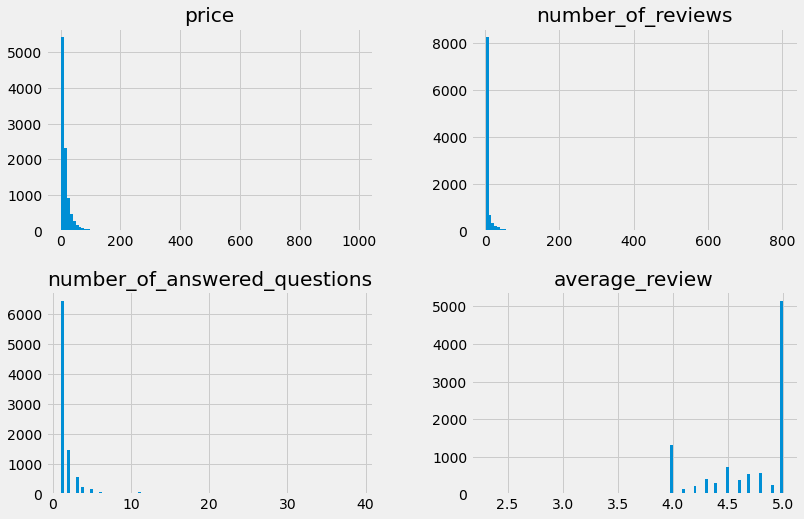

In [23]:
amazon.hist(figsize=(12,8), bins=100);
plt.show()

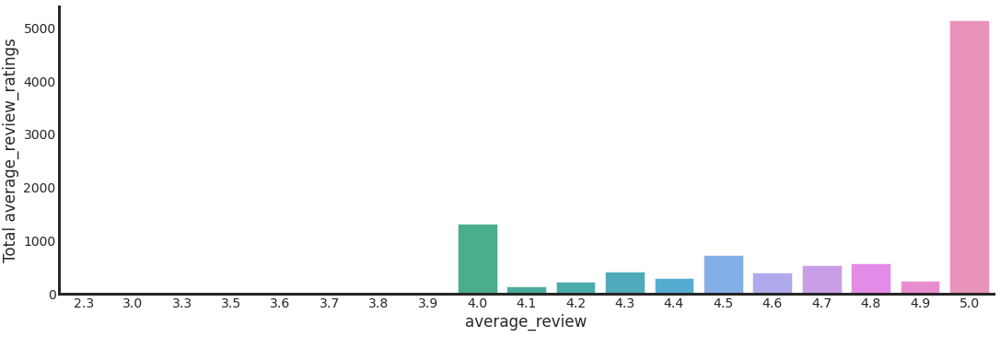

In [24]:
# Check the distribution of the rating
with sns.axes_style('ticks'):
    g = sns.factorplot('average_review', data=amazon, aspect=3.0,kind='count')
    g.set_ylabels('Total average_review_ratings');

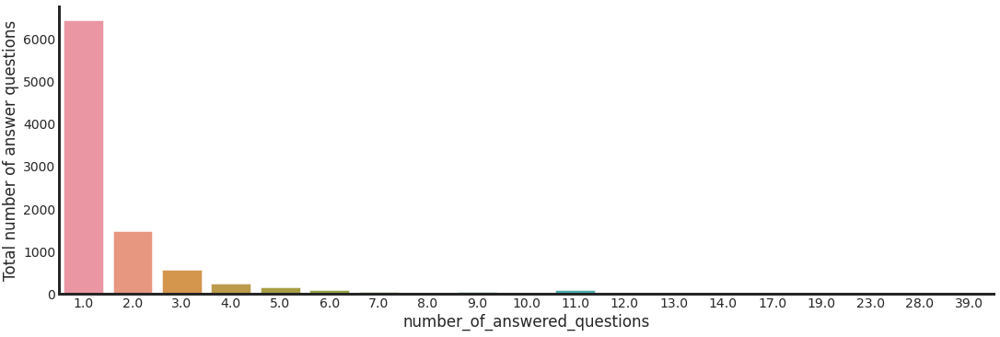

In [25]:
# Check the distribution of the answer questions
with sns.axes_style('ticks'):
    g = sns.factorplot('number_of_answered_questions', data=amazon, aspect=3.0,kind='count')
    g.set_ylabels('Total number of answer questions');

In [26]:
amazon['number_of_reviews'].iplot(kind='hist', bins=30, xTitle='Number of Reviews',linecolor='gray',
                                  yTitle='count',title='Total number of reviews')

### Visualization of the Product category and sub product category

In [27]:
amazon['product_cat'].iplot(kind='hist', bins=100, xTitle='Product Category', linecolor='gray',
    yTitle='count', title='Product category Count Distribution')

In [28]:
amazon['product_sub_cat'].iplot(kind='hist', bins=70, xTitle='Product Sub Category', linecolor='gray',
    yTitle='count', title='Product Sub category Count Distribution')

In [29]:
amazon['product_subs_cat'].iplot(kind='hist', bins=100, xTitle='Product Sub sub Category', linecolor='gray',
    yTitle='count', title='Product Sub sub category Count Distribution')

### Top Products Sold by Product category, number of reviews and average review

In [30]:
amz_review = amazon.sort_values('average_review', ascending= False)
amz_n_review = amazon.sort_values('number_of_reviews', ascending= False)
amz_product_cat = amazon.sort_values('product_cat', ascending= False)

In [31]:
#initialize interactive graph object
fig = go.Figure()

#add each of the graph traces for likes, views and comments
fig.add_trace(
    go.Bar(
        y=amz_review['product_name'].head(10),
        x=amz_review['average_review'].head(10),
        hovertext=amz_review['price'],
        orientation='h',
        name= 'Average review',
        marker=dict(color = 'purple')))

fig.add_trace(
    go.Bar(
        y=amz_product_cat['product_name'].head(10),
        x=amz_product_cat['number_of_reviews'].head(10),
        hovertext=amz_product_cat['price'],
        orientation='h',
        name= 'Number of Reviews',
        visible=False,
        marker=dict(color = 'pink')))

fig.add_trace(
    go.Bar(
        y=amz_n_review['product_name'].head(10),
        x=amz_n_review['product_cat'].head(10),
        hovertext=amz_n_review['price'],
        orientation='h',
        name= 'product category',
        visible= False,
        marker= dict(color ='red')))

#update layout with buttons, corresponding to each trace
fig.update_layout(
    {
    'title' : {
        'font_size' : 20,
        'text' : 'Top 10 Products by Average review, Number of reviews and Product category '}},
    yaxis = {'title' : 'Product name'},
    updatemenus= [dict(
        type='buttons',
        direction='right',
        active=0,
        y=1.1,
        x=0.8,
        buttons=list([
            dict(label='average review rate'
                ,method='update'
                ,args=[{'visible' : [True,False,False]},
                     {'title' : 'Top 10 Trending Products by average review rate',
                     'xaxis': {'title': 'Average review rate'}}]),
            dict(label='Number of Reviews'
                ,method='update'
                ,args=[{'visible' : [False,True,False]},
                    {'title' : 'Top 10 Trending products by number of reviews',
                     'xaxis': {'title': 'product category'}}]),
            dict(label='product category'
                ,method='update'
                ,args=[{'visible' : [False,False,True]},
                {'title' : 'Top 10 Trending Videos by product category',
                'xaxis': {'title': 'Product category'}}])
        ])
        )])
#display figure
fig.show()

### Correlation Matrix

In [32]:
for col in amazon.columns: 
    print(col)

product_name
manufacturer
price
number_of_reviews
number_of_answered_questions
description
product_information
customer_reviews
average_review
product_cat
product_sub_cat
product_subs_cat


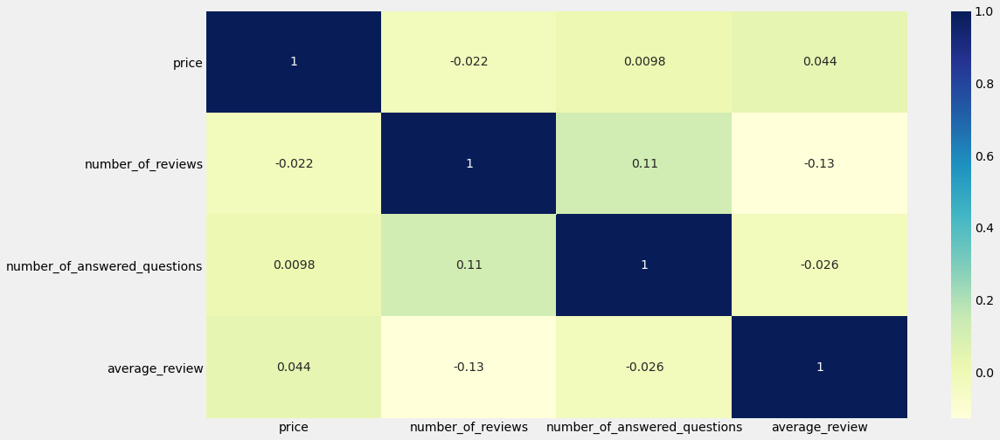

In [33]:
cor = amazon.corr()

# plotting correlations on a heatmap
plt.figure(figsize=(16,8))

# heatmap
sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

### Handling NaN values 
**average review**

**'customer_reviews'**

Are two important columns in the future analyses that have a small number of missing values that will influence to proceed with the models.
We got 18 NaN values in average_review, so instead of delet the rows we are going to replace with value 3.0 which is fill in the Neutral category, and 21 NaN values in customer reviews, here we decide to go with a more neutral word(same).

In [34]:
amazon.isnull().sum()

product_name                       0
manufacturer                       7
price                              0
number_of_reviews                 18
number_of_answered_questions     765
description                      651
product_information               58
customer_reviews                  21
average_review                    18
product_cat                      690
product_sub_cat                  690
product_subs_cat                4613
dtype: int64

In [35]:
amazon['average_review']= amazon['average_review'].fillna(3.0)
amazon['customer_reviews'] = amazon['customer_reviews'].fillna('same')

##  Classifying text as positive, negative or Neutral

### Creating a new column call 'Sentiment'

This column is going to be based in the average review that is in a range of 0.0 to 5.0.
If the score is below 4.0 is going to be Negative, equal 4.0 is consider Neutral andabove 4.0 until 5.0 is Positive sentiment

In [36]:
#Applying the function in our new column
amazon['sentiment'] = amazon.apply(define_sentiment, axis=1)
amazon.head(3)

,product_name,manufacturer,price,number_of_reviews,number_of_answered_questions,description,product_information,customer_reviews,average_review,product_cat,product_sub_cat,product_subs_cat,sentiment
0,Hornby 2014 Catalogue,Hornby,3.42,15.0,1.0,Product Description Hornby 2014 Catalogue Box ...,Technical Details Item Weight640 g Product Dim...,Worth Buying For The Pictures Alone (As Ever) ...,4.9,Hobbies,Model Trains & Railway Sets,Rail Vehicles,Positive
1,FunkyBuys® Large Christmas Holiday Express Fes...,FunkyBuys,16.99,2.0,1.0,Size Name:Large FunkyBuys® Large Christmas Hol...,Technical Details Manufacturer recommended age...,Four Stars // 4.0 // 18 Dec. 2015 // By\n \...,4.5,Hobbies,Model Trains & Railway Sets,Rail Vehicles,Positive
2,CLASSIC TOY TRAIN SET TRACK CARRIAGES LIGHT EN...,ccf,9.99,17.0,2.0,BIG CLASSIC TOY TRAIN SET TRACK CARRIAGE LIGHT...,Technical Details Manufacturer recommended age...,**Highly Recommended!** // 5.0 // 26 May 2015 ...,3.9,Hobbies,Model Trains & Railway Sets,Rail Vehicles,Negative


In [37]:
pd.DataFrame(amazon.groupby('sentiment')['average_review'].count())

,average_review
sentiment,
Negative,39
Neutral,1312
Positive,8649


<a id="section-five"></a>
# Story Generation and Visualization from reviews

By go further in the exploratory data analysis on texts we are try to understand what features contributes to the sentiment category.

* Prior analysis assumptions:

* Higher the rate the sentiment becomes positive

* There are be many positive sentiment reviews which lead to bias

* These assumptions will be verified with our plots also we will do text analysis.

### Sentiment vs. Average Review
Look for a relationship between these two variables

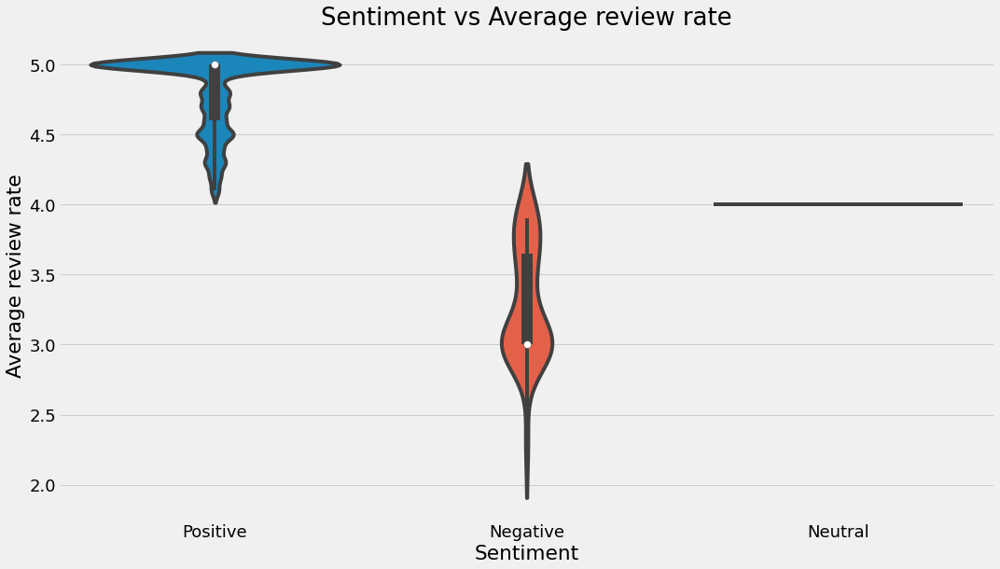

In [38]:
#plot layout
plt.rcParams.update({'font.size': 18})
rcParams['figure.figsize'] = 16,9

#Plotting 
sns.violinplot( x=amazon['sentiment'], y=amazon['average_review'])
plt.title('Sentiment vs Average review rate')
plt.xlabel('Sentiment')
plt.ylabel('Average review rate')
plt.show()

In [39]:
amazon['sentiment'].iplot(kind='hist', xTitle='sentiment',
                  yTitle='average_review', title='Sentiment Distribution')

<a id="section-six"></a>
# Text Reviews

### Review Text Ponctuation and  creat stop words


NLKT stop words contains words like not, hasn't,would'nt which actually conveys a negative sentiment. If we remove that it will end up contradicting the target variable(sentiment). So I have curated the stop words which doesn't have any negative sentiment or any negative alternatives.

In [40]:
#Apply the review cleaning function to eliminate number and characters
amazon['customer_reviews'] = amazon['customer_reviews'].apply(lambda x:review_cleaning(x))
amazon.head(2)

,product_name,manufacturer,price,number_of_reviews,number_of_answered_questions,description,product_information,customer_reviews,average_review,product_cat,product_sub_cat,product_subs_cat,sentiment
0,Hornby 2014 Catalogue,Hornby,3.42,15.0,1.0,Product Description Hornby 2014 Catalogue Box ...,Technical Details Item Weight640 g Product Dim...,worth buying for the pictures alone as ever ...,4.9,Hobbies,Model Trains & Railway Sets,Rail Vehicles,Positive
1,FunkyBuys® Large Christmas Holiday Express Fes...,FunkyBuys,16.99,2.0,1.0,Size Name:Large FunkyBuys® Large Christmas Hol...,Technical Details Manufacturer recommended age...,four stars dec by kenneth bell ...,4.5,Hobbies,Model Trains & Railway Sets,Rail Vehicles,Positive


In [41]:
create_stop_words = ['yourselves', 'between', 'whom', 'itself', 'is', "she's", 'up', 'herself', 'here', 'your', 'each', 
             'we', 'he', 'my', "you've", 'having', 'in', 'both', 'for', 'themselves', 'are', 'them', 'other',
             'and', 'an', 'during', 'their', 'can', 'yourself', 'she', 'until', 'so', 'these', 'ours', 'above', 
             'what', 'while', 'have', 're', 'more', 'only', "needn't", 'when', 'just', 'that', 'were', "don't", 
             'very', 'should', 'any', 'y', 'isn', 'who',  'a', 'they', 'to', 'too', "should've", 'has', 'before',
             'into', 'yours', "it's", 'do', 'against', 'on',  'now', 'her', 've', 'd', 'by', 'am', 'from', 
             'about', 'further', "that'll", "you'd", 'you', 'as', 'how', 'been', 'the', 'or', 'doing', 'such',
             'his', 'himself', 'ourselves',  'was', 'through', 'out', 'below', 'own', 'myself', 'theirs', 
             'me', 'why', 'once',  'him', 'than', 'be', 'most', "you'll", 'same', 'some', 'with', 'few', 'it',
             'at', 'after', 'its', 'which', 'there','our', 'this', 'hers', 'being', 'did', 'of', 'had', 'under',
             'over','again', 'where', 'those', 'then', "you're", 'i', 'because', 'does', 'all']

In [42]:
amazon['customer_reviews'] = amazon['customer_reviews'].apply(lambda x: ' '.join([word for word in x.split() if word not in 
                                                                                  (create_stop_words)]))

### Creating additional features for text analysis

Create **polarity, review length and word count**

* Polarity: By using Textblob for figuring out the rate of sentiment between [-1,1] where -1 is negative and 1 is positive

* Review length: length of the review which includes each letters and spaces

* Word length: It measures how many words are in the customer review column

In [43]:
amazon['polarity'] = amazon['customer_reviews'].map(lambda x: TextBlob(x).sentiment.polarity)
amazon['review_len'] = amazon['customer_reviews'].astype(str).apply(len)
amazon['word_count'] = amazon['customer_reviews'].apply(lambda x: len(str(x).split()))

In [44]:
amazon.head(3)

,product_name,manufacturer,price,number_of_reviews,number_of_answered_questions,description,product_information,customer_reviews,average_review,product_cat,product_sub_cat,product_subs_cat,sentiment,polarity,review_len,word_count
0,Hornby 2014 Catalogue,Hornby,3.42,15.0,1.0,Product Description Hornby 2014 Catalogue Box ...,Technical Details Item Weight640 g Product Dim...,worth buying pictures alone ever april copnove...,4.9,Hobbies,Model Trains & Railway Sets,Rail Vehicles,Positive,0.372154,1291,192
1,FunkyBuys® Large Christmas Holiday Express Fes...,FunkyBuys,16.99,2.0,1.0,Size Name:Large FunkyBuys® Large Christmas Hol...,Technical Details Manufacturer recommended age...,four stars dec kenneth bell dec happy communic...,4.5,Hobbies,Model Trains & Railway Sets,Rail Vehicles,Positive,0.800000,99,16
2,CLASSIC TOY TRAIN SET TRACK CARRIAGES LIGHT EN...,ccf,9.99,17.0,2.0,BIG CLASSIC TOY TRAIN SET TRACK CARRIAGE LIGHT...,Technical Details Manufacturer recommended age...,highly recommended may simonb may simple great...,3.9,Hobbies,Model Trains & Railway Sets,Rail Vehicles,Negative,0.254532,1584,244


### Understanding the Sentiment polarity distribution

In [45]:
amazon['polarity'].iplot(kind='hist', bins=50, xTitle='polarity', linecolor='gray',
    yTitle='count', title='Sentiment Polarity Distribution')

In [46]:
amazon['average_review'].iplot(kind='hist', xTitle='rating', linecolor='gray',
    yTitle='count',title='Average Review Rating Distribution')

### Review Text Length Distribution

In [47]:
amazon['review_len'].iplot(kind='hist', bins=50, xTitle='Review length', linecolor='gray',
    yTitle='count', title='Review Text Length Distribution')

In [48]:
amazon['word_count'].iplot(kind='hist', bins=50, xTitle='word count', linecolor='gray',
    yTitle='count', title='Review Text Word Count Distribution')

## N-gram analysis

*Using ngrams to analyse the text, based on it's sentiment *

In [49]:
#Creating a copy of the dataset
amazon_clean = amazon.copy()

In [50]:
positive_rev = amazon_clean[amazon_clean['sentiment']=='Positive'].dropna()
neutral_rev= amazon_clean[amazon_clean['sentiment']=='Neutral'].dropna()
negative_rev = amazon_clean[amazon_clean['sentiment']=='Negative'].dropna()

In [51]:
positive_rev.shape

(3882, 16)

In [52]:
neutral_rev.shape

(607, 16)

In [53]:
negative_rev.shape

(7, 16)

### Bigram analysis

**We had to opt for plot only Positive and Neutral sentiment as there is no Negative row with sentiment to work on it, so we will plot most frequent two words in reviews based on sentiments**

In [54]:
from collections import defaultdict

## Create bar chart from positive reviews 
freq_dict = defaultdict(int)
for sent in positive_rev['customer_reviews']:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
df_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
df_sorted.columns = ['word', 'wordcount']
trace0 = horizontal_bar_chart(df_sorted.head(20), 'green')

## Create bar chart from neutral reviews
freq_dict = defaultdict(int)
for sent in neutral_rev['customer_reviews']:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
df_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
df_sorted.columns = ['word', 'wordcount']
trace1 = horizontal_bar_chart(df_sorted.head(20), 'orange')


# Creating two subplots
fig = tools.make_subplots(rows=2, cols=1, vertical_spacing=0.04,
                          subplot_titles=['Bigram plots of Positive reviews', 'Bigram plots of Neutral reviews'])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)

fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title='Bigram Plots')
iplot(fig, filename='word-plots')

### Let's see the results for Trigram

In [55]:
## Create bar chart from positive reviews 
freq_dict = defaultdict(int)
for sent in positive_rev['customer_reviews']:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
df_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
df_sorted.columns = ['word', 'wordcount']
trace0 = horizontal_bar_chart(df_sorted.head(10), 'green')

## Create bar chart from neutral reviews
freq_dict = defaultdict(int)
for sent in neutral_rev['customer_reviews']:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
df_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
df_sorted.columns = ['word', 'wordcount']
trace1 = horizontal_bar_chart(df_sorted.head(10), 'orange')


# Creating two subplots
fig = tools.make_subplots(rows=2, cols=1, vertical_spacing=0.04,
                          subplot_titles=['Trigram plots of Positive reviews', 'Trigram plots of Neutral reviews'])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)

fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title='Trigram Plots')
iplot(fig, filename='word-plots')

### Go further using Tengram

In [56]:
## Create bar chart from positive reviews 
freq_dict = defaultdict(int)
for sent in positive_rev['customer_reviews']:
    for word in generate_ngrams(sent,10):
        freq_dict[word] += 1
df_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
df_sorted.columns = ['word', 'wordcount']
trace0 = horizontal_bar_chart(df_sorted.head(10), 'green')

## Create bar chart from neutral reviews
freq_dict = defaultdict(int)
for sent in neutral_rev['customer_reviews']:
    for word in generate_ngrams(sent,10):
        freq_dict[word] += 1
df_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
df_sorted.columns = ['word', 'wordcount']
trace1 = horizontal_bar_chart(df_sorted.head(10), 'orange')


# Creating two subplots
fig = tools.make_subplots(rows=2, cols=1, vertical_spacing=0.04,
                          subplot_titles=['Tengram plots of Positive reviews', 'Tengram plots of Neutral reviews'])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)

fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title='Tengram Plots')
iplot(fig, filename='word-plots')

### Wordcloud Positive reviews

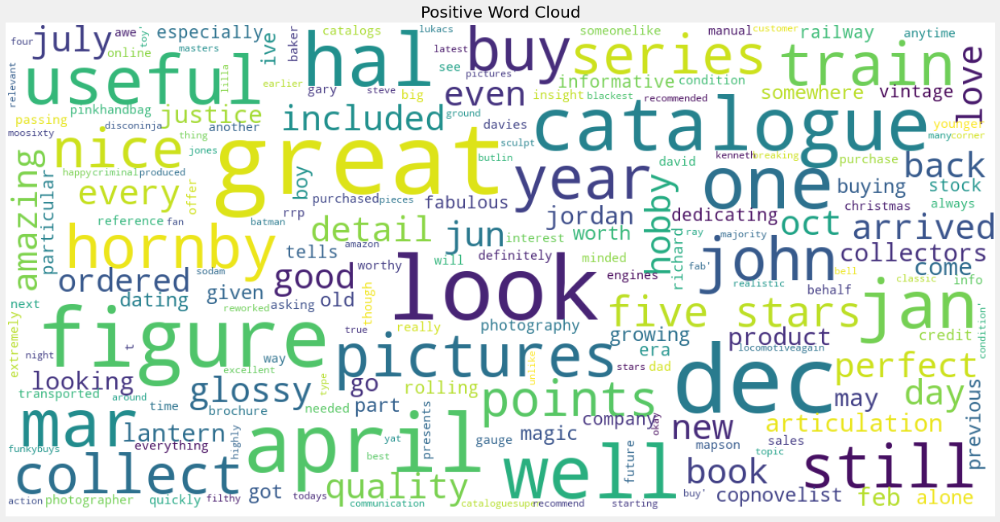

In [57]:
txt = positive_rev['customer_reviews'].values
wordcloud = WordCloud(background_color = 'white', max_words=200,
     max_font_size=40,random_state=4692, scale=3, stopwords = STOPWORDS).generate(str(txt))
                
plt.figure(figsize=(28,22))
ax4 = plt.subplot2grid((4, 2), (2, 0), colspan=2,rowspan=2)
ax4.set_title('Positive Word Cloud',fontsize=20)
ax4.imshow(wordcloud)
ax4.axis('off')
plt.show()

### Wordcloud Negative Reviews

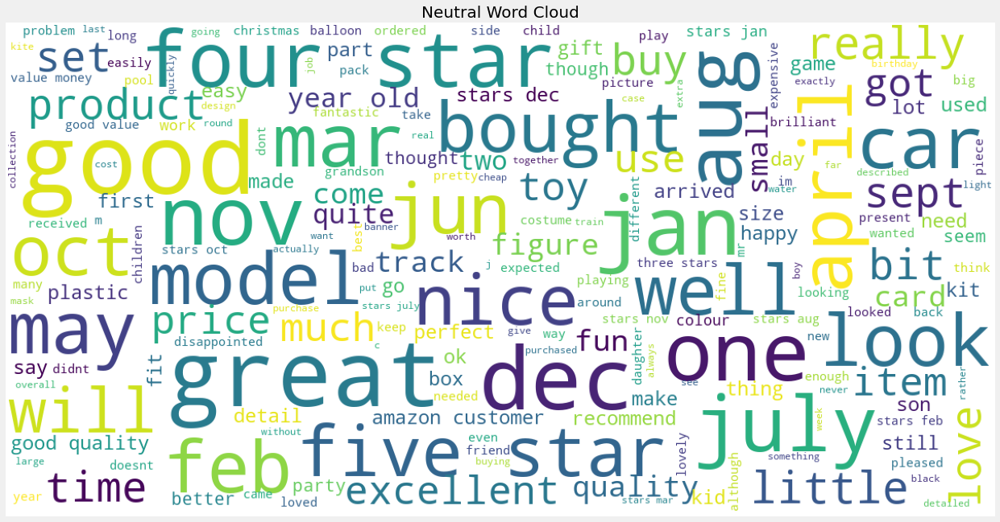

In [58]:
txt = neutral_rev['customer_reviews'].values
wordcloud = WordCloud(background_color = 'white', max_words=200,
     max_font_size=40,random_state=4692, scale=3, stopwords = STOPWORDS).generate(str(txt))

plt.figure(figsize=(28,22))
ax4 = plt.subplot2grid((4, 2), (2, 0), colspan=2,rowspan=2)
ax4.set_title('Neutral Word Cloud',fontsize=20)
ax4.imshow(wordcloud)
ax4.axis('off')
plt.show()

<a id="section-seven"></a>
# Extracting Features from Cleaned reviews

Before we build the model for our sentiment analysis, it is required to convert the review texts into vector formation as computer cannot understand words and their sentiment. In this project, we are going to use TF-TDF method to convert the texts

### Encoding target variable-sentiment
Let's encode our target variable with Label encoder.

In [59]:
# calling the label encoder function
label_encoder = preprocessing.LabelEncoder() 
  
# Encode labels in column 'sentiment'. 
amazon['sentiment']= label_encoder.fit_transform(amazon['sentiment']) 
  
amazon['sentiment'].unique() 

array([2, 0, 1])

In [60]:
amazon['sentiment'].value_counts()

2    8649
1    1312
0      39
Name: sentiment, dtype: int64

### Stemming the reviews
Stemming is a method of deriving root word from the inflected word. Here we extract the customer reviews and convert the words to its root word.

There is another technique knows as **Lemmatization** where it converts the words into root words which has a semantic meaning.

In [61]:
#Extracting 'reviews' for processing
review_features=amazon.copy()
review_features=review_features[['customer_reviews']].reset_index(drop=True)
review_features.head()

,customer_reviews
0,worth buying pictures alone ever april copnove...
1,four stars dec kenneth bell dec happy communic...
2,highly recommended may simonb may simple great...
3,love july lilla lukacs july love perfect earli...
4,birthday present april love dog april bought g...


In [62]:
#splitting and adding the stemmed words except stopwords
corpus = []
for i in range(0, len(review_features)):
    review = re.sub('[^a-zA-Z]', ' ', review_features['customer_reviews'][i])
    review = review.split()
    ps = PorterStemmer()
    review = [ps.stem(word) for word in review if not word in create_stop_words]
    review = ' '.join(review)
    corpus.append(review)   

After apply the stemmed words, the text will look like this.

In [63]:
corpus[25]

'fabul juli amazon custom juli got yr old he obsess train love charact pretti tough surviv bash thing cant get attach ball socket joint bit fiddli help repeatedli come apart quit easili howev wont issu get older got brewster wilson time see got but think will get track koko xma play age love talk not sure realis train talk think talk could set year counsel fabul toy feb patsi feb bought whole set chuggington interact train train set grandson play come visit twice year live itali think fun listen speak absolut fascin doesnt fit chuggington rail track feb ian halstead feb toy much larger chugginton toy doesnt fit chuggington rail track cue disappoint year old think clearer descript toyotherwis work fine describ love feb mr ca daniel feb purchas well old puffer pete extra track littl year old grandson daddi love perfect well made deliv fast star class product seller good fun oct buggymom oct old love train fun talk help build interact imagin game not robust toy but fine kid dont play roug

## TFIDF(Term Frequency — Inverse Document Frequency)
This is a technique to quantify a word in documents, we generally compute a weight to each word which signifies the importance of the word in the document and corpus. This method is a widely used technique in Information Retrieval and Text Mining.

Here we are splitting as ngram_range (1,2) which means unigrams and bigrams and consider their combined weight.Also we are taking only the top 5000 words from the customer reviews.


In [64]:
tfidf_vectorizer = TfidfVectorizer(max_features=5000,ngram_range=(1,2))
# TF-IDF feature matrix
X= tfidf_vectorizer.fit_transform(review_features['customer_reviews'])

### Define Target Variable

In [65]:
y = amazon['sentiment']

### Handling Imbalance target using feature-SMOTE

We noticed that we got a lot of positive sentiments compared to negative and neutral. So it is crucial to balanced the classes in such situation. 
SMOTE(Synthetic Minority Oversampling Technique)is used to balance out the imbalanced dataset problem.
It aims to balance class distribution by randomly increasing minority class examples by replicating them.

In [66]:
print(f'Original dataset shape : {Counter(y)}')

smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X, y)

print(f'Resampled dataset shape {Counter(y_res)}')

Original dataset shape : Counter({2: 8649, 1: 1312, 0: 39})
Resampled dataset shape Counter({2: 8649, 0: 8649, 1: 8649})


### Split the dataset 70:30 train and test respectivelly

In [67]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size= 0.3, random_state=7925)

<a id="section-eigth"></a>
# Model Building: Sentiment Analysis

Perform model selection to find the best model using cross validation.

In [68]:
from sklearn.ensemble import RandomForestClassifier

logreg_cv = LogisticRegression(random_state=7925)
dt_cv=DecisionTreeClassifier()
knn_cv=KNeighborsClassifier()
svc_cv=SVC()
nb_cv=BernoulliNB()
rfc = RandomForestClassifier()
cv_dict = {0: 'Logistic Regression', 1: 'Decision Tree',2:'KNN',3:'SVC',4:'Naive Bayes', 5: 'Random Forest Classifier'}
cv_models=[logreg_cv,dt_cv,knn_cv,svc_cv,nb_cv, rfc]


for i,model in enumerate(cv_models):
    print('{} Test Accuracy: {:.2f}'.format(cv_dict[i],cross_val_score(model, X, y, cv=10, scoring ='accuracy').mean()))

Logistic Regression Test Accuracy: 0.89
Decision Tree Test Accuracy: 0.84
KNN Test Accuracy: 0.18
SVC Test Accuracy: 0.89
Naive Bayes Test Accuracy: 0.43
Random Forest Classifier Test Accuracy: 0.89


From the results, we can see that Logistic Regression and SVC algorithms present accuracies around 89%. That's great.

So let's implement in logistic regression and SVC the hyperparameter tuning.

## LOGISTIC REGRESSION

In [69]:
param_grid = {'C': np.logspace(-1, 1, 20),
             'penalty':['l1', 'l2']}
clf = GridSearchCV(LogisticRegression(random_state=7925), param_grid,cv=10, verbose=0,n_jobs=-1)
best_model = clf.fit(X_train,y_train)
print(best_model.best_estimator_)
print('The mean Test accuracy of the model is:',best_model.score(X_test,y_test))

LogisticRegression(C=10.0, random_state=7925)
The mean Test accuracy of the model is: 0.9392421323057161


In [70]:
logreg = LogisticRegression(C=10.0, random_state=7925)
logreg.fit(X_train, y_train)
print('Accuracy of logistic regression classifier on train set: {:.2f}'.format(logreg.score(X_train, y_train)))

Accuracy of logistic regression classifier on train set: 0.98


In [71]:
y_pred = logreg.predict(X_test)
print('Classification Report:\n',classification_report(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.96      1.00      0.98      2568
           1       0.89      0.93      0.91      2597
           2       0.97      0.88      0.93      2620

    accuracy                           0.94      7785
   macro avg       0.94      0.94      0.94      7785
weighted avg       0.94      0.94      0.94      7785



## Classification metrics
**Here we plot the confusion matrix with ROC and check our f1 score**

Confusion matrix, without normalization


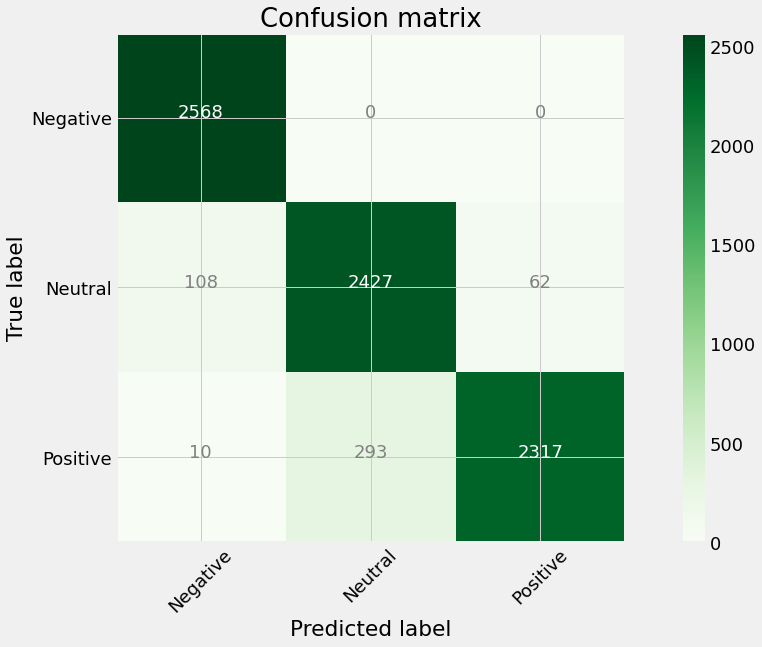

In [72]:
cm = metrics.confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cm, normalize=False, classes=['Negative','Neutral','Positive'])

In [73]:
y_train.shape

(18162,)

In [74]:
X_train.shape

(18162, 5000)

## RANDOM FOREST CLASSIFIER

In [75]:
parameters = [ {'n_estimators':[5,10,15,20,25,30,35], 'criterion':['entropy', 'gini'],
                'max_depth':[1,2,3,4,5,6,7,8,9,10,11],'max_features':['sqrt','log2'],'random_state':[67235]}]
grid_search_c = GridSearchCV(RandomForestClassifier(), parameters, scoring = 'accuracy')
grid_search_c.fit(X_train, y_train)

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid=[{'criterion': ['entropy', 'gini'],
                          'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
                          'max_features': ['sqrt', 'log2'],
                          'n_estimators': [5, 10, 15, 20, 25, 30, 35],
                          'random_state': [67235]}],
             scoring='accuracy')

In [76]:
grid_search_c.best_estimator_

RandomForestClassifier(max_depth=11, max_features='sqrt', n_estimators=35,
                       random_state=67235)

In [77]:
grid_search_c.best_score_

0.8620739616413905

### Hyperparameter Tuning

In [78]:
rfc=RandomForestClassifier(n_estimators=10, criterion='entropy', max_depth=20, max_features='sqrt', random_state=62375)
rfc.fit(X_train,y_train)
rfc.score(X_train, y_train)

0.9398194031494329

In [79]:
y_pred = rfc.predict(X_test)
print (classification_report(y_test, y_pred.round()))

              precision    recall  f1-score   support

           0       0.91      1.00      0.95      2568
           1       0.89      0.82      0.85      2597
           2       0.87      0.85      0.86      2620

    accuracy                           0.89      7785
   macro avg       0.89      0.89      0.89      7785
weighted avg       0.89      0.89      0.89      7785



### Confusion Matrix

Confusion matrix, without normalization


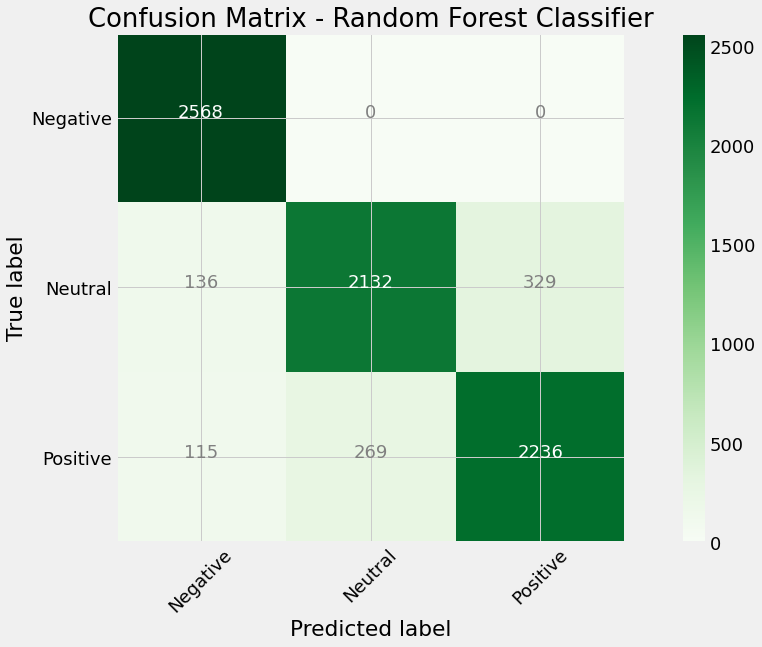

In [80]:
cm_rfc =  metrics.confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cm_rfc, normalize = False, classes=['Negative','Neutral','Positive'],
                      title  = 'Confusion Matrix - Random Forest Classifier')

### Confusion Matrix

#Binarizing the target feature
y = label_binarize(y, classes=[0, 1, 2])
n_classes = y.shape[1]

#Train-Test split(70:30)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3,
                                                    random_state=7925)

#OneVsRestClassifier
classifier = OneVsRestClassifier(svm.SVC(kernel='linear', probability=True,
                                 random_state=7925))
y_score = classifier.fit(X_train, y_train).decision_function(X_test)

#Computing TPR and FPR
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

#Compute micro-average ROC curve and ROC area
fpr['micro'], tpr['micro'], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc['micro'] = auc(fpr['micro'], tpr['micro'])
    
#aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

#interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

#Finally average it and compute AUC
mean_tpr /= n_classes

fpr['macro'] = all_fpr
tpr['macro'] = mean_tpr
roc_auc['macro'] = auc(fpr['macro'], tpr['macro'])

#Plot all ROC curves
plt.figure()
plt.plot(fpr['micro'], tpr['micro'],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc['micro']),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr['macro'], tpr['macro'],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc['macro']),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=4,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=4)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic to multi-class')
plt.legend(loc='lower right')

cm = metrics.confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cm, classes=['Negative','Neutral','Positive'])
plt.show()

In [83]:
def confusion_matrix(model, X_test, y_test):

    fig, ax = plt.subplots(figsize=(8,8))

    plot_confusion_matrix(model, X_test, y_test, normalize=True, cmap='Oranges')

    ax.set_title('Confusion matrix\n(Normalized values)', fontsize=16, fontweight='bold')
    ax.set_xlabel('Predicted label', fontsize=18)
    ax.set_ylabel('True label', fontsize=18)
  
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_teste, y_pred)
  
    print(f'Accuracy = {acc:.3f}')

<a id="section-two"></a>
#  Walmart Dataset

## Import Libraries

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
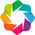

In [84]:
#Apriori libraries 
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

#Visualization libraries
import altair as alt
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')

In [85]:
walmart = pd.read_csv('Walmart.csv')
walmart.head(3)

,Uniq Id,Crawl Timestamp,Product Url,Product Name,Description,List Price,Sale Price,Brand,Item Number,Gtin,Package Size,Category,Postal Code,Available
0,459b05f3cb7f1cba0a36fdc042ff0056,2019-03-22 17:10:04 +0000,https://www.walmart.com/ip/In-Style-Eyes-Catey...,In Style Eyes Cateye Two Tone Reading Glasses,Stunning Looking Cat Eye Two Tone Reading Glas...,19.99,19.99,In Style Eyes,NaN,9.664782e+10,NaN,Health|Home Health Care|Daily Living Aids,NaN,True
1,6a1bddc2801cbba539be0c182498d4dd,2019-03-22 17:10:04 +0000,https://www.walmart.com/ip/In-Style-Eyes-Catey...,In Style Eyes Cateye Two Tone Reading Glasses,Stunning Looking Cat Eye Two Tone Reading Glas...,19.99,19.99,In Style Eyes,NaN,9.664782e+10,NaN,Health|Home Health Care|Daily Living Aids,NaN,True
2,4d237340ae8361b4bb4f51e8a6128c8b,2019-03-22 17:10:04 +0000,https://www.walmart.com/ip/In-Style-Eyes-Catey...,In Style Eyes Cateye Two Tone Reading Glasses,Stunning Looking Cat Eye Two Tone Reading Glas...,19.99,19.99,In Style Eyes,NaN,9.664782e+10,NaN,Health|Home Health Care|Daily Living Aids,NaN,True


In [86]:
walmart.describe()

,List Price,Sale Price,Item Number,Gtin,Postal Code
count,29881.000000,29881.000000,3.891000e+03,2.966500e+04,0.0
mean,94.430457,88.763223,1.802987e+11,6.035239e+11,NaN
std,402.535560,386.598926,6.965897e+11,2.452373e+11,NaN
min,0.590000,0.100000,3.464885e+07,4.176000e+03,NaN
25%,15.260000,14.990000,6.422131e+10,6.027983e+11,NaN
50%,27.950000,25.000000,8.147500e+10,6.892886e+11,NaN
75%,58.980000,55.230000,8.892741e+10,7.292335e+11,NaN
max,22144.550000,22144.550000,9.788866e+12,9.912112e+11,NaN


In [87]:
walmart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Uniq Id          30000 non-null  object 
 1   Crawl Timestamp  30000 non-null  object 
 2   Product Url      30000 non-null  object 
 3   Product Name     30000 non-null  object 
 4   Description      29912 non-null  object 
 5   List Price       29881 non-null  float64
 6   Sale Price       29881 non-null  float64
 7   Brand            28966 non-null  object 
 8   Item Number      3891 non-null   float64
 9   Gtin             29665 non-null  float64
 10  Package Size     22755 non-null  object 
 11  Category         29266 non-null  object 
 12  Postal Code      0 non-null      float64
 13  Available        30000 non-null  bool   
dtypes: bool(1), float64(5), object(8)
memory usage: 3.0+ MB


In [88]:
walmart.isnull().sum()

Uniq Id                0
Crawl Timestamp        0
Product Url            0
Product Name           0
Description           88
List Price           119
Sale Price           119
Brand               1034
Item Number        26109
Gtin                 335
Package Size        7245
Category             734
Postal Code        30000
Available              0
dtype: int64

In [89]:
walmart.shape

(30000, 14)

In [90]:
walmart['Crawl Timestamp'].unique()

array(['2019-03-22 17:10:04 +0000', '2019-03-22 17:46:46 +0000',
       '2019-03-22 17:35:44 +0000', ..., '2019-03-11 20:18:52 +0000',
       '2019-03-11 20:12:00 +0000', '2019-03-11 20:57:31 +0000'],
      dtype=object)

In [91]:
#Convert the 'Date' column to datetime format
walmart['Crawl Timestamp']= pd.to_datetime(walmart['Crawl Timestamp'])
 
#Extracting year,month and day
walmart['year'] = walmart['Crawl Timestamp'].apply(lambda x : x.year)
walmart['month'] = walmart['Crawl Timestamp'].apply(lambda x : x.month)
walmart['day'] = walmart['Crawl Timestamp'].apply(lambda x : x.day)
walmart['weekday'] = walmart['Crawl Timestamp'].apply(lambda x : x.weekday())
walmart.tail(3)

,Uniq Id,Crawl Timestamp,Product Url,Product Name,Description,List Price,Sale Price,Brand,Item Number,Gtin,Package Size,Category,Postal Code,Available,year,month,day,weekday
29997,41e228c9f27d0dfc98b3cbb0824181f8,2019-03-11 20:57:31+00:00,https://www.walmart.com/ip/MightySkins-Skin-De...,MightySkins Skin Decal Wrap Compatible with HP...,Do You Want Your HP 17t Laptop 17.3&quot; (201...,19.99,19.99,Mightyskins,NaN,7.924363e+11,"size-hppavilionx36011""(2017)",Electronics|Electronics Learning Center|Ads Fr...,NaN,True,2019,3,11,0
29998,cbd04f1cb09cff78ba8150ce882d2f6f,2019-03-11 20:57:31+00:00,https://www.walmart.com/ip/MightySkins-Skin-De...,MightySkins Skin Decal Wrap Compatible with HP...,Do You Want Your HP 17t Laptop 17.3&quot; (201...,19.99,19.99,Mightyskins,NaN,8.248178e+10,"size-hpstream11""(2017)",Electronics|Electronics Learning Center|Ads Fr...,NaN,True,2019,3,11,0
29999,3fcebbbd970ff33580c8a25ee267a540,2019-03-11 20:57:31+00:00,https://www.walmart.com/ip/MightySkins-Skin-De...,MightySkins Skin Decal Wrap Compatible with HP...,Do You Want Your HP 17t Laptop 17.3&quot; (201...,19.99,19.99,Mightyskins,NaN,7.329405e+11,"size-hpspectrex36013""(2018)",Electronics|Electronics Learning Center|Ads Fr...,NaN,True,2019,3,11,0


In [92]:
walmart['Product Name'].unique()

array(['In Style Eyes Cateye Two Tone Reading Glasses',
       'Upper Crust Caribbean Coconut Panko Bread Crumbs, 10 Pound -- 1 each.',
       'Fish Tank Ornament Plastic Decoration Plant Suction Cup 4 Pcs',
       ...,
       'Osram P-VIP 350/1.3 E21.8 High Quality Original OEM Projector Bulb',
       'Huron River Geese-RUSFRE128906 Print 6.75"x8.75" by Rusty Frentner in a Affordable Canadian Walnut Medium',
       'Preparing Sunday Dinner : A Collaborative Approach to Worship and Preaching'],
      dtype=object)

In [93]:
# Dropping Postal Code as no information
walmart.drop(columns=['Postal Code','Item Number','Gtin', 'Package Size', 'Brand'], inplace=True)

In [94]:
clean_df = walmart.copy()
#display how many nulls are in each column
px.bar(clean_df.isnull().sum()
       ,title='Nulls Per Column'
       ,color=clean_df.isnull().sum().index)

## Exploratory Data Analysis

In [95]:
walmart['year'].unique

<bound method Series.unique of 0        2019
1        2019
2        2019
3        2019
4        2019
         ... 
29995    2019
29996    2019
29997    2019
29998    2019
29999    2019
Name: year, Length: 30000, dtype: int64>

In [96]:
#Filtering data by year  
df = walmart.groupby(['year']).filter(lambda x: (x['year'] == 2019).any())

#Plotting monthly data of number of quantity purchased in 2019 
sales_2019 = hv.Bars(df.groupby(['month'])['Product Name'].count()).opts(ylabel=' Number of items',
                                                                         title='Number of items sold in 2019')
# plot
sales_2019(opts.Bars(width=380, height=400,tools=['hover'],show_grid=True))

:Bars   [month]   (Product Name)

In [97]:
#Plotting day transaction across a typical day
sales_day = hv.Curve(walmart.groupby(['day'])['Product Name'].count()).opts(ylabel='Number of items',
                                                                            title='Cummulative day transactions March 2019')

#Line chart
sales_day.opts(opts.Curve(width=800, height=300,tools=['hover'],show_grid=True))

:Curve   [day]   (Product Name)

 **We can see that our Dataset has sales of the Products only in March of 2019, between days 11 to 25**

## Number of quantity purchased across weekdays

In [98]:
# First lets make a copy of the dataset
temp = walmart.copy()

In [104]:
#Converting weekday variable to category
temp.weekday = temp.weekday.astype('category') 

#Creating a new dataframe which has the frequency of weekdays
weekday_bin=temp['weekday'].value_counts().to_frame().reset_index().rename(columns={'index':'weekday','weekday':'count'})

#Plotting bar chart
bars = alt.Chart(weekday_bin).mark_bar(color='darkorange').encode(x='weekday',
    y=alt.Y('count',title='Number of purchases')

#Adding data labels
txt = bars.mark_text(align='center',baseline='middle',dy=-7 ,size=15,
).encode(
    txt='count',
    tooltip=[alt.Tooltip('weekday'),
            alt.Tooltip('count')]
)

#Combining both
(bars + txt).properties(
    width=800,
    height=400,
    title="Number of quanityt purchases across weekdays"
)

SyntaxError: invalid syntax (<ipython-input-104-33a16eb79b5c>, line 12)

 **The plot above 0 means Mondays and 4 Fridays**

### Compare Top 10 products sold and Bottom 10 products

In [105]:
walmart_df = walmart.rename(columns={'Product Name': 'product_name'})

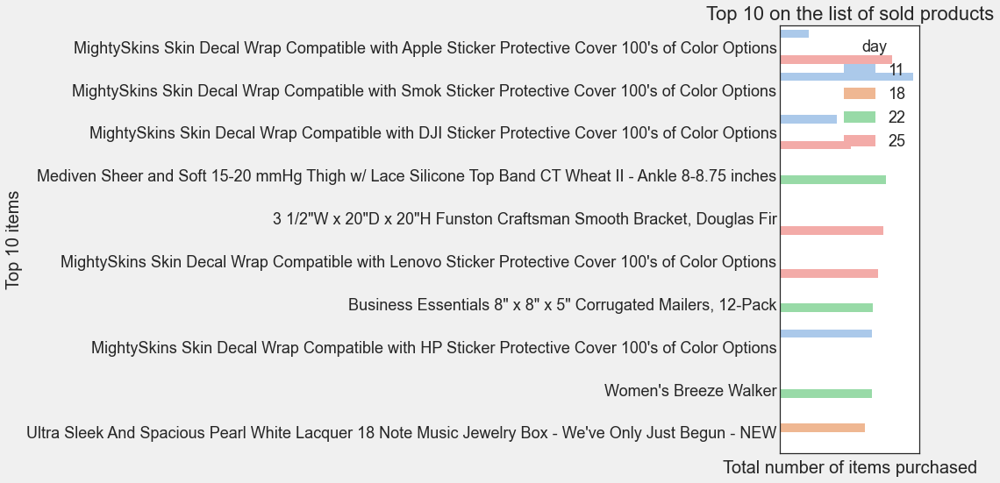

In [106]:
#Setting plot style
plt.figure(figsize = (15, 8))
plt.style.use('seaborn-white')

#plt.subplot(1,2,1)
ax=sns.countplot(y='product_name', hue='day', data=walmart_df, palette='pastel',
              order=walmart_df.product_name.value_counts().iloc[:10].index)

ax.set_xticklabels(ax.get_xticklabels(),fontsize=11,rotation=40, ha='left')
ax.set_title('Top 10 on the list of sold products',fontsize= 22)
ax.set_xlabel('Total number of items purchased',fontsize = 20) 
ax.set_ylabel('Top 10 items', fontsize = 20)
plt.tight_layout()


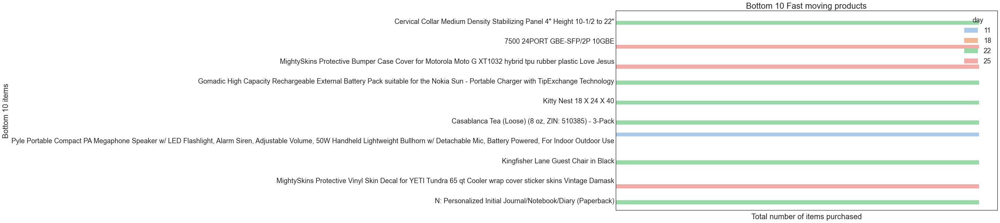

In [107]:
#Bottom 10 fast moving products

ax=sns.countplot(y= 'product_name', hue='day', data=walmart_df, palette='pastel',
              order=walmart_df.product_name.value_counts().iloc[-10:].index)
ax.set_xticklabels(ax.get_xticklabels(),fontsize=11,rotation=40, ha='left')
ax.set_title('Bottom 10 Fast moving products',fontsize= 22)
ax.set_xlabel('Total number of items purchased',fontsize = 20) 
ax.set_ylabel('Bottom 10 items', fontsize = 20)
plt.tight_layout()

## Best Product Wordcloud

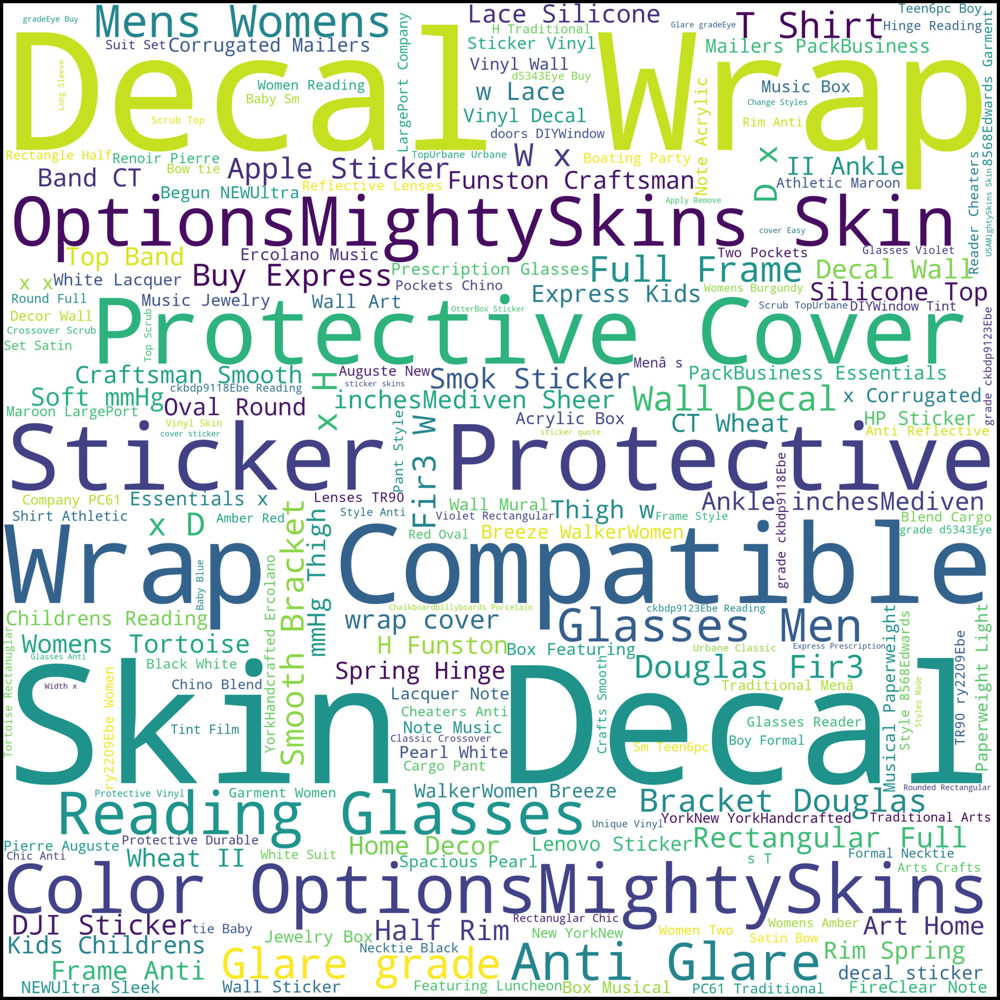

In [108]:
#Wordcloud
wordcloud = WordCloud(
    width = 3000,
    height = 3000,
    background_color = 'white').generate("".join(walmart_df['product_name']))
fig = plt.figure(
    figsize = (50, 30),
    facecolor = 'k',
    edgecolor = 'k')

#Display plot
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

## Data Preparation

In [109]:
temp['qty_purchased']=walmart['Product Name'].map(walmart['Uniq Id'].value_counts())

#Getting the top customers based on quantity purchased
#top_customers=temp[['Uniq Id', 'qty_purchased','year']].sort_values(by = 'qty_purchased',ascending = False).head(500)

In [116]:
#Creating sparse matrix 
basket = (temp.groupby(['Product Name', 'Product Name'])['qty_purchased']
          .sum().unstack().reset_index())

#Eoding the quantity urchased
def encode(x):
    '''Encoding the quantity of products with 0s and 1s
    0:when qty is less than or equal to 0
    1:when qty is greater than or equal to 1'''
    if x <= 0:
        return 0
    if x >= 1:
        return 1
    
#Appying on our data
basket_sets = basket.applymap(encode)
basket_sets

TypeError: '<=' not supported between instances of 'str' and 'int'

## Applying Apriori
Here we apply apriori algorithm and get all the frequent itemsets(with 70% as support threshold) and apply association rules function to derive rules where we use lift metric

In [117]:
#Apriori- Support70%
frequent_itemsets = apriori(basket_sets, min_support=0.07, use_colnames=True)

#Associaton rules-using lift
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1)
rules.tail()

NameError: name 'basket_sets' is not defined

In [ ]:
for col in walmart.columns: 
    print(col)

In [ ]:
cor = walmart.corr()
cor

In [ ]:
# plotting correlations on a heatmap

plt.figure(figsize=(16,8))
sns.heatmap(cor, cmap='YlGnBu', annot=True)
plt.show()

# 3. Wish dataset

In [ ]:
## Reading the DATASET
wish = pd.read_csv('WishSummerproducts_2020-08.csv')
wish.head(3)

In [ ]:
wish.describe()

In [ ]:
wish.info()

In [ ]:
wish.isnull().sum()

In [ ]:
sns.heatmap(wish.isnull(), cbar=False);

In [ ]:
wish.shape

## Drop the columns with Null values and does not afect our objectives 

In [ ]:
wish.drop('has_urgency_banner', axis=1, inplace=True)

In [ ]:
wish.drop('merchant_profile_picture', axis='columns', inplace=True)

In [ ]:
wish.drop('urgency_text', axis='columns', inplace=True)

In [ ]:
wish.drop('product_variation_size_id', axis='columns', inplace=True)

In [ ]:
sns.heatmap(wish.isnull(), cbar=False);

In [ ]:
wish.shape

In [ ]:
wish.hist(edgecolor='black', linewidth=1.2, figsize=(16,12));
plt.show()

In [ ]:
correlation = wish.corr()
correlation.style.background_gradient(cmap='coolwarm')

### Visualization

In [ ]:
sns.distplot(wish.price);

In [ ]:
# I think this retail price is not significant, better stick with price only (Sirlene opinion)
sns.distplot(wish.retail_price);

### What is the 'X' axis (units sold) means?
#### the 'y' axis count the total, but I did not understand the Graphic (Sirlene question)

In [ ]:
import matplotlib.ticker as ticker
ax = wish['units_sold'].plot(kind='bar', figsize=(12,8))
ax.xaxis.set_major_locator(ticker.AutoLocator())
plt.xticks(rotation=45)
plt.grid(linestyle='--')
plt.title('Amount of Units sold');

In [ ]:
import matplotlib.ticker as ticker
ax = wish['units_sold'].plot(kind='bar', figsize=(16,12))
ax.xaxis.set_major_locator(ticker.IndexLocator(base=100,offset=50))
plt.xticks(rotation=45)
plt.title('Amount of Units sold');

In [ ]:
sns.countplot(wish.uses_ad_boosts);
#0 goes for no?

In [ ]:
sns.distplot(wish.rating);

In [ ]:
sns.countplot(wish.origin_country);

In [ ]:
print('Median of units sold is',wish['units_sold'].median())
print('Mean of units sold is',wish['units_sold'].mean())
wish['units_sold'].value_counts()

In [ ]:
wish[wish['units_sold'] >= 20000].head()

# number of products that sold more than 20k units

In [ ]:
pd.crosstab(wish['uses_ad_boosts'], wish['rating'] >= 4.5)

# Use ad boosts and have rating higher than 4.5

In [ ]:
pd.crosstab(wish['uses_ad_boosts'], wish['units_sold'])

#use ad boosts and sales results

In [ ]:
# Ploting a scatter matrix
pd.plotting.scatter_matrix(wish, figsize=(40, 25))
plt.show()

# References



#Reference os the Smote library used for balance the dataset
https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/